# Music Genre Classification
* By Wai Ping Jerry KWOK
* Created on 2023-11-25

### Introduction
In this assignment, you will build a neural network model that can classify music files into various genres using Mel-frequency cepstral coefficients (MFCCs) as features. You will use Python libraries such as Librosa for audio processing, Keras, and TensorFlow for building and training the neural network.

### Objectives
First, implement a machine learning model to classify music files into different genres based on their audio features. 

### Requirements:
1. Python Libraries: Ensure you have *librosa*, *keras*, and *tensorflow* installed in your Python environment.
2. Datasets: You will use the *GTZAN* genre collection. Make sure you are familiar with the dataset before you begin working on the coding portion. You will also need the YouTube comments dataset from the last project.
3. Note: You may use the code snippets and functions provided in class or use your own novel approach to accomplish the tasks outlined in the problems.

### **Music Genre Classification**

In [10]:
import warnings
warnings.filterwarnings('ignore')

In [112]:
# import libraries
import librosa
import librosa.feature
import librosa.display
import glob
import numpy as np
import matplotlib.pyplot as plt
import os
import IPython
import IPython.display
from prettytable import PrettyTable

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras.utils import to_categorical

In [12]:
# set random seed for reproducibility
np.random.seed(80)

In [143]:
# the gtzan dataset is downloaded from kaggle
# https://www.kaggle.com/datasets/carlthome/gtzan-genre-collection

# setup the path to the music data
MUSIC_PATH = 'c:/Users/jerry/OneDrive - Red River College Polytech/Documents/COMP3703_intro_to_a_i/module_4_neural_nets/project/gtzan/genres'

# get the list of genres from directory structure of the music data
genres = list(os.listdir(f'{MUSIC_PATH}'))
print(genres)

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


#### **1. Data Visualization**
* Write a function *display_mfcc(song)* that takes a music file as input, computes its MFCCs, and displays the MFCCs. You may use the code provided in class for this task or accomplish this task as you wish.

In [14]:
# create a function to compute and display MFCC
def display_mfcc(song):
    # load the song
    y, sampling_rate = librosa.load(song)

    # compute MFCC
    mfcc = librosa.feature.mfcc(y=y, sr=sampling_rate)

    # display the song
    IPython.display.Audio(y, rate=sampling_rate)
    
    # display the MFCC
    plt.figure(figsize=(10,4))
    librosa.display.specshow(mfcc, x_axis='time', y_axis='mel', cmap='coolwarm')
    plt.colorbar()
    plt.title(f'MFCC of {song}')
    plt.tight_layout()
    plt.show()

* Test this function with one song from each genre from the dataset.
* Display all of graphs for the songs you choose.

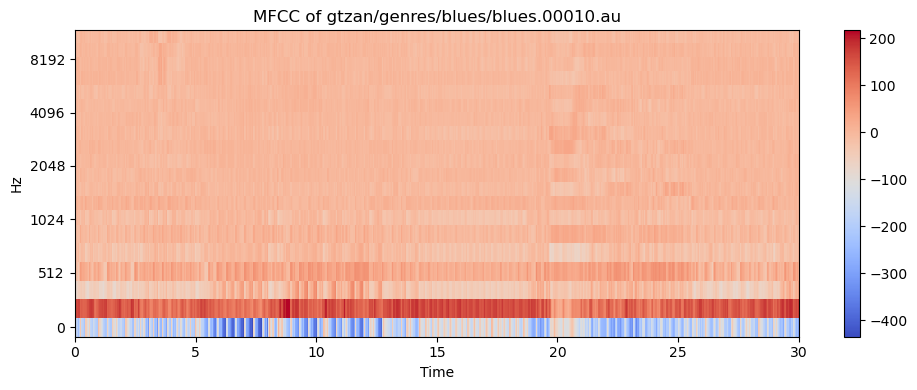

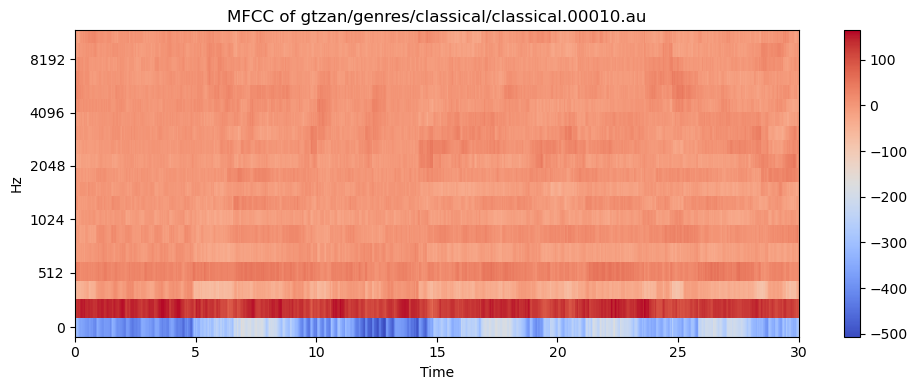

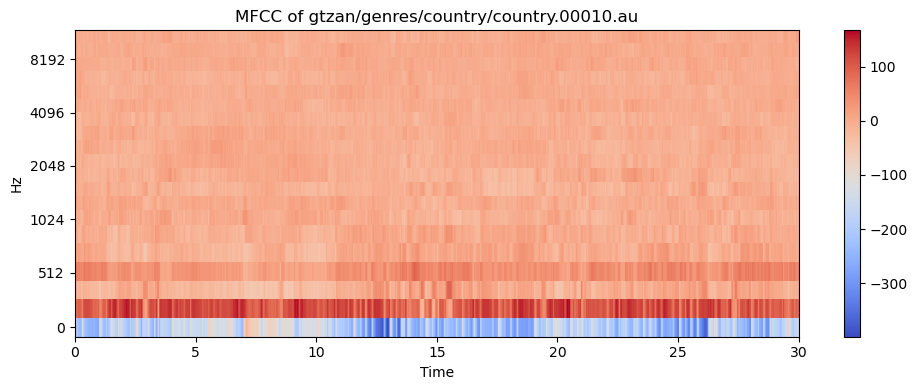

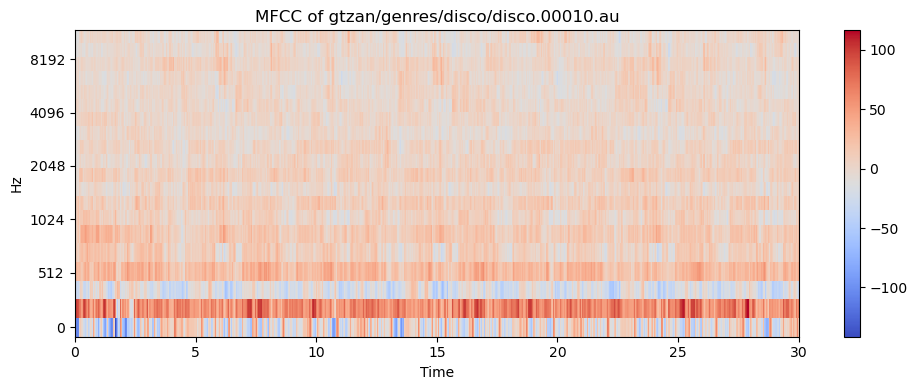

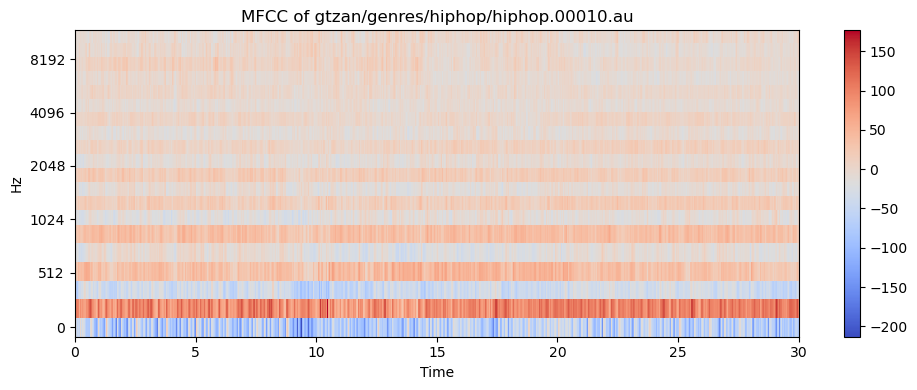

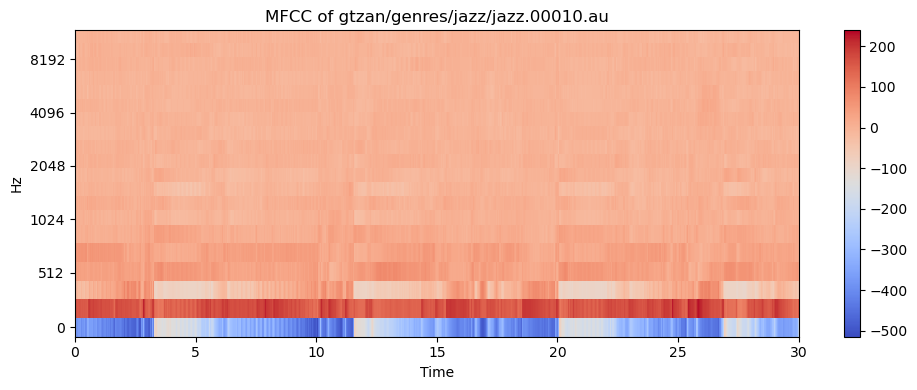

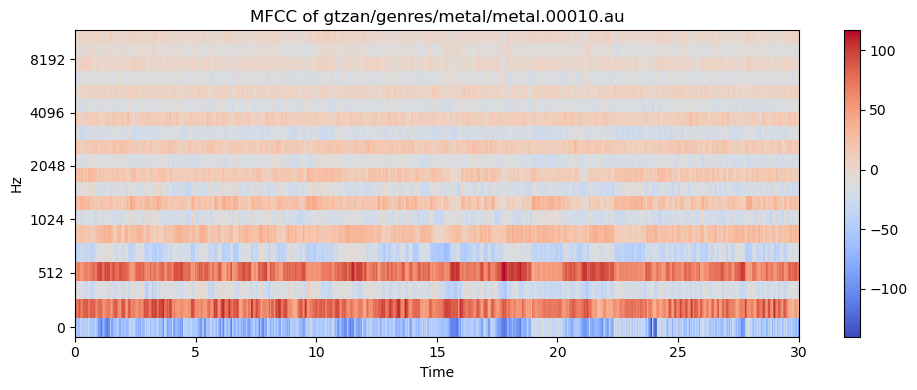

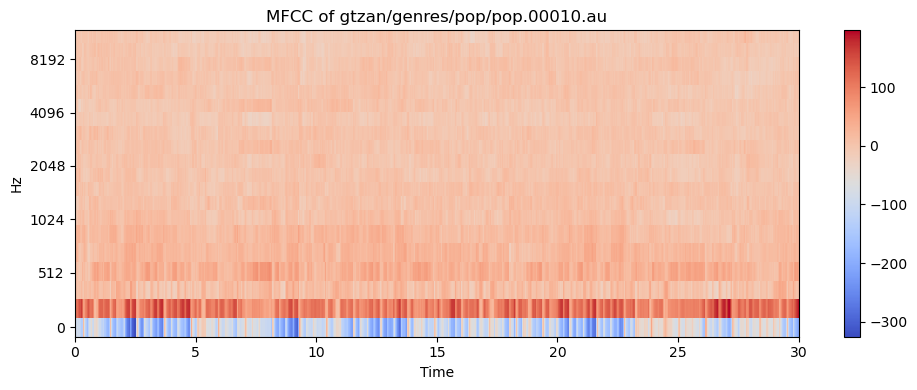

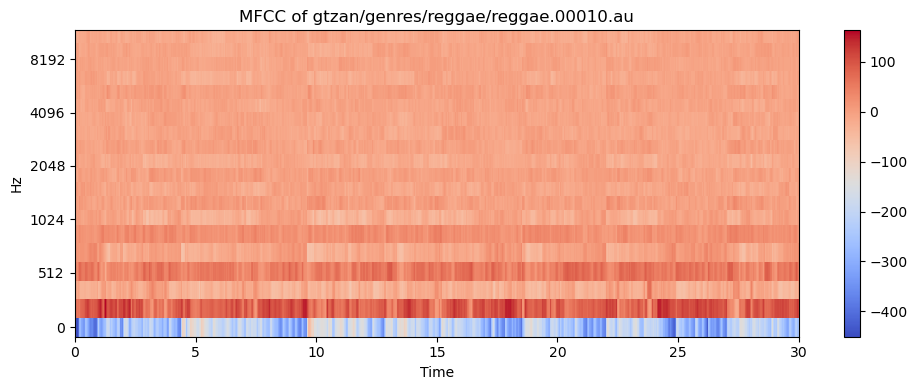

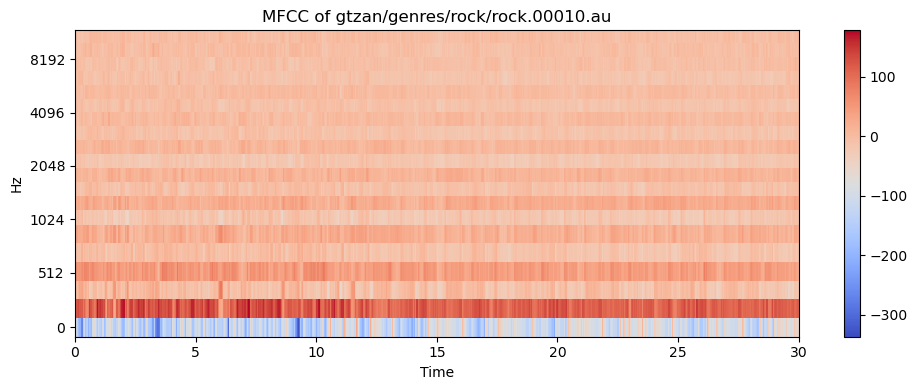

In [15]:
# test the function from each genre
for genre in genres:
    song = f'{MUSIC_PATH}/{genre}/{genre}.00010.au'
    display_mfcc(song)

#### **2. Feature Extraction**
* Implement the *extract_features_song(f)* function to extract MFCC features from a given song file.
* Normalize these features as done in the provided code.

In [16]:
# create a function to extract the MFCC features from the music data
def extract_features_song(song):
    # load the song
    y, _ = librosa.load(song)

    # get the MFCC features
    mfcc = librosa.feature.mfcc(y=y)

    # normalize the MFCC features between -1, 1 (divided by max of the absolute value)
    mfcc /= np.amax(np.absolute(mfcc))

    # return the MFCC features withe the same size
    return np.ndarray.flatten(mfcc)[:25000] 

In [17]:
# get one random song from one random genre as a test song
genre = np.random.choice(genres)
song = np.random.choice(os.listdir(f'{MUSIC_PATH}/{genre}'))

sample_song = f'{MUSIC_PATH}/{genre}/{song}'

In [18]:
# test the function
mfcc_sample = extract_features_song(sample_song)
print(mfcc_sample)

[-0.17608076 -0.08187982 -0.13356072 ...  0.02551799 -0.02400359
 -0.02988508]


#### **3. Feature and Label Preparation**
* Modify the *generate_features_and_labels()* function to process all songs in your dataset, extract features using the above function, and create genre labels for each song.
* Convert these labels into a one-hot encoded format.

In [19]:
# define a function to generate the features and labels from the music data
def generate_features_and_labels():
    # create empty list for the features and labels
    all_features = []
    all_labels = []

    # iterate through the genres
    for genre in genres:
        # get the list of sound files
        sound_files = glob.glob(f'{MUSIC_PATH}/{genre}/*.au')

        # print the number of songs in each genre
        print('Processing %d songs in %s genre...' %(len(sound_files), genre))

        # iterate through the sound files
        for song in sound_files:
            # extract the features
            features = extract_features_song(song)

            # append the features and labels to the list
            all_features.append(features)
            all_labels.append(genre)

    # convert the labels to one-hot encoding
    # get the unique labels
    label_uniq_ids, label_row_ids = np.unique(all_labels, return_inverse=True)
    label_row_ids = label_row_ids.astype(np.int32, copy=False)
    # convert to one-hot encoding
    onehot_labels = to_categorical(label_row_ids, len(label_uniq_ids)) 

    return np.stack(all_features), onehot_labels

In [20]:
# generate the features and labels
features, labels = generate_features_and_labels()

Processing 100 songs in blues genre...
Processing 100 songs in classical genre...
Processing 100 songs in country genre...
Processing 100 songs in disco genre...
Processing 100 songs in hiphop genre...
Processing 100 songs in jazz genre...
Processing 100 songs in metal genre...
Processing 100 songs in pop genre...
Processing 100 songs in reggae genre...
Processing 100 songs in rock genre...


#### **4. Model Building**
* Construct a neural network using Keras with at least two layers: a dense layer with ReLU activation and an output layer with softmax activation.

In [69]:
# setup the input size
input_size = np.shape(features)[1]
print(input_size)

25000


In [72]:
# build a neural network model
model1 = Sequential()

# add the input layer
model1.add(Input(shape=(input_size,)))

# add the hidden layers
model1.add(Dense(units=128))
model1.add(Activation('relu'))

# add the output layer
model1.add(Dense(units=10))
model1.add(Activation('softmax'))

* Compile the model with appropriate loss and optimizer functions.

In [73]:
# compile the model
model1.compile(loss='categorical_crossentropy', 
               optimizer='adam', 
               metrics=['accuracy'])

# show the model summary
print(model1.summary())

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_32 (Dense)             (None, 128)               3200128   
_________________________________________________________________
activation_31 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_33 (Dense)             (None, 10)                1290      
_________________________________________________________________
activation_32 (Activation)   (None, 10)                0         
Total params: 3,201,418
Trainable params: 3,201,418
Non-trainable params: 0
_________________________________________________________________
None


#### **5. Training and Evaluation**
Split your data into training and testing sets and train your model on the training data. Evaluate the performance of your model on the test data and output the loss and accuracy. The following outlines how to appropriately prep the data, you may use the detailed outline or prep your data as you wish.

##### **Printing Shapes of Features and Labels**
* *print(np.shape(features))*: Prints the shape of the *features* array, which contains the extracted MFCC features from all the music files.
* *print(np.shape(labels))*: Prints the shape of the *labels* array, which contains the one-hot encoded genre labels for each music file.

In [74]:
# check the shape of the features and labels
print(np.shape(features))
print(np.shape(labels))

(1000, 25000)
(1000, 10)


##### **Setting the Training Split Ratio**
* *training_split = 0.8*: Defines the ratio of the dataset to be used for training. Here, 80% of the data is allocated for training, and the remaining 20% for testing.

In [25]:
# setup the training and testing split
training_split = 0.8

##### **Combining Features and Labels**
* *alldata = np.column_stack((features, labels))*: Combines the features and labels into a single array. Each row in alldata now contains both the features of a music file and its corresponding genre label.

In [26]:
# combine the features and labels
alldata = np.column_stack((features, labels))

# check the shape of the combined data
print(np.shape(alldata))

(1000, 25010)


##### **Shuffling the Data**
* *np.random.shuffle(alldata)*: Randomly shuffles the rows of the *alldata* array. This step is crucial to ensure that the training and testing sets are randomly sampled from the entire dataset.

In [27]:
# shuffle the data
np.random.shuffle(alldata)

##### **Splitting Data into Training and Test Sets**
* *splitidx = int(len(alldata) * training_split)*: Calculates the index at which to split the dataset based on the training split ratio.
* *train, test = alldata[:splitidx,:], alldata[splitidx:,:]*: Splits the alldata array into two arrays: train (containing 80% of the data) and test (containing the remaining 20%).

In [28]:
# calculate the index to split the data into training and testing data
splitidx = int(len(alldata) * training_split)

# split the data into training and testing data
train, test = alldata[:splitidx,:], alldata[splitidx:,:]

In [29]:
# check the shape of the training and testing data
print(np.shape(train))
print(np.shape(test))

(800, 25010)
(200, 25010)


##### **Separating Features and Labels for Training and Testing**
* *train_input = train[:,:-10]*: Extracts the feature part of the training data. Assumes the last 10 columns are labels (based on the number of genres).
* *train_labels = train[:,-10:]*: Extracts the label part of the training data.
* Similarly, *test_input* and *test_labels* are extracted for the test data.

In [30]:
# extract the features and labels from the training data
train_input = train[:, :-10]
train_labels = train[:, -10:]

# extract the features and labels from the testing data
test_input = test[:, :-10]
test_labels = test[:, -10:]

# check the shape of the training and testing data
print(np.shape(train_input))
print(np.shape(train_labels))
print(np.shape(test_input))
print(np.shape(test_labels))

(800, 25000)
(800, 10)
(200, 25000)
(200, 10)


#### **6. Reporting**
* After training, report the accuracy of your model. Sample output should look as follows:

In [31]:
# define a function to plot the accuracy and loss of the model
def plot_history(model):
    plt.figure(figsize=(8,4))
    
    # plot the accuracy
    plt.subplot(1, 2, 1)
    plt.plot(model.history.history['acc'])
    plt.plot(model.history.history['val_acc'])
    plt.title('Accuracy over epochs')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(['train accuracy', 'validation accuracy'], loc='lower right')

    # plot the loss
    plt.subplot(1, 2, 2)
    plt.plot(model.history.history['loss'])
    plt.plot(model.history.history['val_loss'])
    plt.title('Loss over epochs')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train loss', 'validation loss'], loc='upper left')

    plt.tight_layout()
    plt.show()

In [75]:
# train the model
history1 = model1.fit(train_input, train_labels, epochs=20, batch_size=16, validation_split=0.2)

Train on 640 samples, validate on 160 samples
Epoch 1/20
640/640 [==============================] - 1s 1ms/sample - loss: 2.0488 - acc: 0.3203 - val_loss: 1.5497 - val_acc: 0.5250
Epoch 2/20
640/640 [==============================] - 1s 918us/sample - loss: 1.3196 - acc: 0.5391 - val_loss: 1.4535 - val_acc: 0.4875
Epoch 3/20
640/640 [==============================] - 1s 948us/sample - loss: 0.9444 - acc: 0.7016 - val_loss: 1.2360 - val_acc: 0.5562
Epoch 4/20
640/640 [==============================] - 1s 910us/sample - loss: 0.7282 - acc: 0.7719 - val_loss: 1.2875 - val_acc: 0.5437
Epoch 5/20
640/640 [==============================] - 1s 909us/sample - loss: 0.4878 - acc: 0.8891 - val_loss: 1.2148 - val_acc: 0.5625
Epoch 6/20
640/640 [==============================] - 1s 958us/sample - loss: 0.3657 - acc: 0.9312 - val_loss: 1.3221 - val_acc: 0.5437
Epoch 7/20
640/640 [==============================] - 1s 891us/sample - loss: 0.2723 - acc: 0.9594 - val_loss: 1.1911 - val_acc: 0.5625
Epoc

In [76]:
# evaluate the model on the test data
print('Evaluate on test data')
results1 = model1.evaluate(test_input, test_labels, batch_size=16)
print(f'test loss, test acc: {results1}')

Evaluate on test data
200/200 [==============================] - 0s 229us/sample - loss: 1.7305 - acc: 0.5150
test loss, test acc: [1.7304931831359864, 0.515]


* Visualize the training process by plotting the change in accuracy or loss over epochs.
* Display the training accuracy/validation accuracy and training loss and validation loss graphs over the epochs. Sample output:

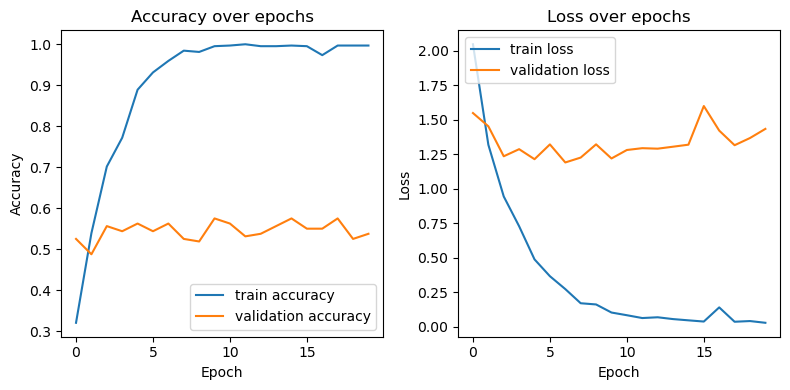

In [77]:
# plot the accuracy and loss of the model
plot_history(model1)

* Interpret the graphs.

**Discussion**

*Accuracy*
* The train accuracy and validation accuracy intersect when the accuracy is about 0.5. After this point, the train accuracy keeps increasing but the validation accuracy does not increase with the training accuracy. It indicates that the model is overfitted. 

*Loss*
* The training loss goes down over epochs, achieving low error values. The validation loss goes down at first but it turns back up again at about the 6 epoch. The model starts to be overfitted at this point. The training may have been stopped at 6 epochs.

#### **7. Bonus Challenge** (Optional)
* Experiment with different neural network architectures or feature sets to improve the model's accuracy.
* Visualize the training process by plotting the change in accuracy or loss over epochs.

##### model2

In [104]:
# construct a different model
model2 = Sequential()

# add the input layer
model2.add(Input(shape=(input_size,)))

# add the hidden layers
model2.add(Dense(units=128))
model2.add(Activation('relu'))
model2.add(Dropout(0.3))
model2.add(Dense(units=128))
model2.add(Activation('relu'))

# add the output layer
model2.add(Dense(units=10))
model2.add(Activation('softmax'))

# compile the model
model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# show the model summary
model2.summary()

Model: "sequential_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_69 (Dense)             (None, 128)               3200128   
_________________________________________________________________
activation_68 (Activation)   (None, 128)               0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_70 (Dense)             (None, 128)               16512     
_________________________________________________________________
activation_69 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_71 (Dense)             (None, 10)                1290      
_________________________________________________________________
activation_70 (Activation)   (None, 10)              

In [105]:
# train the model
history2 = model2.fit(train_input, train_labels, epochs=20, batch_size=16, validation_split=0.2)

Train on 640 samples, validate on 160 samples
Epoch 1/20
640/640 [==============================] - 1s 2ms/sample - loss: 2.2093 - acc: 0.2625 - val_loss: 1.8142 - val_acc: 0.3438
Epoch 2/20
640/640 [==============================] - 1s 961us/sample - loss: 1.7246 - acc: 0.3812 - val_loss: 1.5963 - val_acc: 0.4125
Epoch 3/20
640/640 [==============================] - 1s 981us/sample - loss: 1.5824 - acc: 0.4313 - val_loss: 1.7190 - val_acc: 0.4062
Epoch 4/20
640/640 [==============================] - 1s 939us/sample - loss: 1.5368 - acc: 0.4359 - val_loss: 1.5009 - val_acc: 0.4437
Epoch 5/20
640/640 [==============================] - 1s 987us/sample - loss: 1.3348 - acc: 0.5094 - val_loss: 1.4486 - val_acc: 0.4875
Epoch 6/20
640/640 [==============================] - 1s 959us/sample - loss: 1.2518 - acc: 0.5672 - val_loss: 1.4011 - val_acc: 0.5312
Epoch 7/20
640/640 [==============================] - 1s 964us/sample - loss: 1.0748 - acc: 0.6281 - val_loss: 1.4260 - val_acc: 0.5188
Epoc

In [107]:
# evaluate the model on the test data
print('Evaluate on test data')
results2 = model2.evaluate(test_input, test_labels, batch_size=16)
print(f'test loss, test acc: {results2}')

Evaluate on test data
200/200 [==============================] - 0s 291us/sample - loss: 1.6635 - acc: 0.5250
test loss, test acc: [1.663518238067627, 0.525]


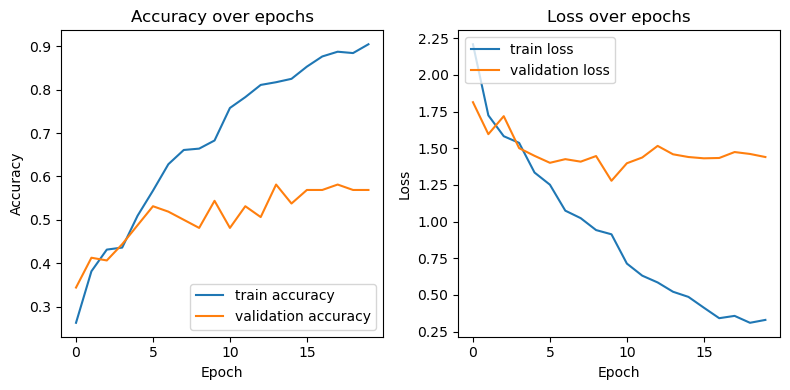

In [108]:
# plot the accuracy and loss of the model
plot_history(model2)

##### model3

In [124]:
# construct a different model
model3 = Sequential()

# add the input layer
model3.add(Input(shape=(input_size,)))

# add the hidden layers
model3.add(Dense(units=128))
model3.add(Activation('relu'))
model3.add(Dropout(0.5))
model3.add(Dense(units=128))
model3.add(Activation('relu'))

# add the output layer
model3.add(Dense(units=10))
model3.add(Activation('softmax'))

# compile the model
model3.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# show the model summary
model3.summary()

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_91 (Dense)             (None, 128)               3200128   
_________________________________________________________________
activation_90 (Activation)   (None, 128)               0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 128)               0         
_________________________________________________________________
dense_92 (Dense)             (None, 128)               16512     
_________________________________________________________________
activation_91 (Activation)   (None, 128)               0         
_________________________________________________________________
dense_93 (Dense)             (None, 10)                1290      
_________________________________________________________________
activation_92 (Activation)   (None, 10)              

In [125]:
# train the model
history3 = model3.fit(train_input, train_labels, epochs=20, batch_size=16, validation_split=0.2)

Train on 640 samples, validate on 160 samples
Epoch 1/20
640/640 [==============================] - 1s 2ms/sample - loss: 2.3461 - acc: 0.1969 - val_loss: 1.9164 - val_acc: 0.3187
Epoch 2/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.9421 - acc: 0.2984 - val_loss: 1.8076 - val_acc: 0.3438
Epoch 3/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.8478 - acc: 0.3266 - val_loss: 1.7588 - val_acc: 0.3688
Epoch 4/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.7636 - acc: 0.3500 - val_loss: 1.6150 - val_acc: 0.4313
Epoch 5/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.6381 - acc: 0.4234 - val_loss: 1.5205 - val_acc: 0.4500
Epoch 6/20
640/640 [==============================] - 1s 2ms/sample - loss: 1.5818 - acc: 0.4234 - val_loss: 1.6049 - val_acc: 0.4187
Epoch 7/20
640/640 [==============================] - 1s 2ms/sample - loss: 1.5062 - acc: 0.4656 - val_loss: 1.5740 - val_acc: 0.4563
Epoch 8/20
640/6

In [126]:
# evaluate the model on the test data
print('Evaluate on test data')
results3 = model3.evaluate(test_input, test_labels, batch_size=16)
print(f'test loss, test acc: {results3}')

Evaluate on test data
200/200 [==============================] - 0s 386us/sample - loss: 1.5987 - acc: 0.4750


test loss, test acc: [1.598739333152771, 0.475]


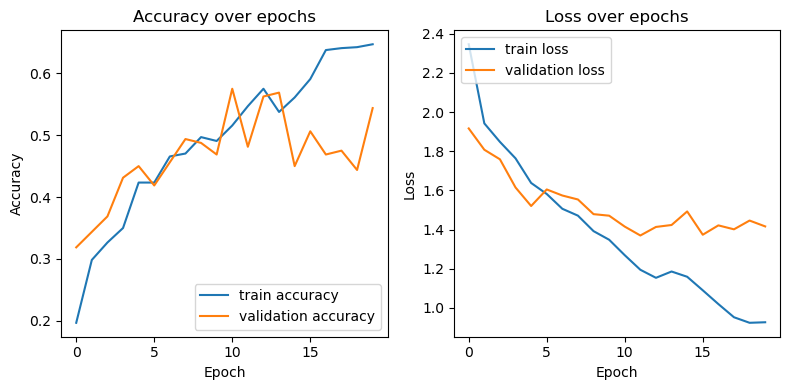

In [127]:
# plot the accuracy and loss of the model
plot_history(model3)

##### model4

In [137]:
# construct a different model
model4 = Sequential()

# add the input layer
model4.add(Input(shape=(input_size,)))
model4.add(Dense(units=128, input_dim=input_size, activation='relu'))

# add the hidden layers
model4.add(Dense(units=256))
model4.add(Activation('relu'))
model4.add(Dropout(0.3))
model3.add(Dense(units=128))
model3.add(Activation('relu'))

# add the output layer
model4.add(Dense(units=10))
model4.add(Activation('softmax'))

# compile the model
model4.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# show the model summary
model4.summary()

Model: "sequential_24"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_101 (Dense)            (None, 128)               3200128   
_________________________________________________________________
dense_102 (Dense)            (None, 256)               33024     
_________________________________________________________________
activation_98 (Activation)   (None, 256)               0         
_________________________________________________________________
dropout_23 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_104 (Dense)            (None, 10)                2570      
_________________________________________________________________
activation_100 (Activation)  (None, 10)                0         
Total params: 3,235,722
Trainable params: 3,235,722
Non-trainable params: 0
___________________________________________

In [138]:
# train the model
history4 = model4.fit(train_input, train_labels, epochs=20, batch_size=16, validation_split=0.2)

Train on 640 samples, validate on 160 samples
Epoch 1/20
640/640 [==============================] - 1s 2ms/sample - loss: 2.1696 - acc: 0.2500 - val_loss: 1.8892 - val_acc: 0.3438
Epoch 2/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.7217 - acc: 0.3797 - val_loss: 1.6295 - val_acc: 0.4000
Epoch 3/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.4802 - acc: 0.4625 - val_loss: 1.5772 - val_acc: 0.4250
Epoch 4/20
640/640 [==============================] - ETA: 0s - loss: 1.2868 - acc: 0.528 - 1s 1ms/sample - loss: 1.2673 - acc: 0.5344 - val_loss: 1.5186 - val_acc: 0.4313
Epoch 5/20
640/640 [==============================] - 1s 1ms/sample - loss: 1.1426 - acc: 0.5984 - val_loss: 1.5160 - val_acc: 0.4437
Epoch 6/20
640/640 [==============================] - 1s 1ms/sample - loss: 0.8958 - acc: 0.6859 - val_loss: 1.4429 - val_acc: 0.4875
Epoch 7/20
640/640 [==============================] - 1s 1ms/sample - loss: 0.7236 - acc: 0.7609 - val_loss: 1.5

In [139]:
# evaluate the model on the test data
print('Evaluate on test data')
results4 = model4.evaluate(test_input, test_labels, batch_size=16)
print(f'test loss, test acc: {results4}')

Evaluate on test data
200/200 [==============================] - 0s 351us/sample - loss: 2.1183 - acc: 0.4850
test loss, test acc: [2.1183368968963623, 0.485]


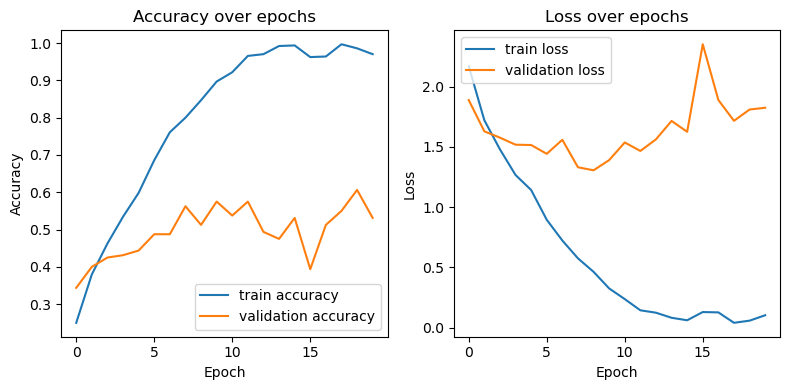

In [140]:
# plot the accuracy and loss of the model
plot_history(model4)

In [141]:
# collect the results
history = [history1, history2, history3, history4]
results = [results1, results2, results3, results4]

In [142]:
# create a table to display the results
pt = PrettyTable(['Model', 
                    'Train Loss', 'Train Accuracy',
                    'Validation Loss', 'Validation Accuracy', 
                    'Test Loss', 'Test Accuracy'])

# add the results to the table
for i in range(4):
    pt.add_row([f'Model {i+1}', 
                history[i].history['loss'][-1], history[i].history['acc'][-1],
                history[i].history['val_loss'][-1], history[i].history['val_acc'][-1],
                results[i][0], results[i][1]])

# print the table
print(pt)

+---------+----------------------+----------------+--------------------+---------------------+--------------------+---------------+
|  Model  |      Train Loss      | Train Accuracy |  Validation Loss   | Validation Accuracy |     Test Loss      | Test Accuracy |
+---------+----------------------+----------------+--------------------+---------------------+--------------------+---------------+
| Model 1 | 0.027704451663885264 |    0.996875    | 1.4347019255161286 |        0.5375       | 1.7304931831359864 |     0.515     |
| Model 2 | 0.32993818037211897  |   0.9046875    | 1.4404459118843078 |       0.56875       | 1.663518238067627  |     0.525     |
| Model 3 |  0.9270138718187809  |    0.646875    | 1.4162876904010773 |       0.54375       | 1.598739333152771  |     0.475     |
| Model 4 | 0.10362295317463577  |   0.9703125    | 1.825101238489151  |       0.53125       | 2.1183368968963623 |     0.485     |
+---------+----------------------+----------------+--------------------+----

**Discussion**

*Difference in architecture*
1. Model 1: Dense layer of 128 as the hidden layers.
2. Model 2: 2 Dense layers of 128 as the hidden layers, with a Dropout of 0.3 in between.
3. Model 3: 2 Dense layers of 128 as the hidden layers, with a Dropout of 0.5 in between.
4. Model 4: Dense layer of 256, Dropout of 0.3, and a Dense layer of 128 as the hidden layers.

The Test Accuracy is improved to 0.525 in Model 2. This model also gives the best validation accuracy.